In [7]:
# Convert COCO to YOLO

import logging
logging.getLogger().setLevel(logging.CRITICAL)
from pylabel import importer

import os 
import pandas as pd
import json
import shutil
from tqdm import tqdm


In [8]:
current_directory = os.getcwd()
print("Current Working Directory:", current_directory)

Current Working Directory: /home/cara/oregon_critters/scripts


In [11]:
#Specify path to the coco.json file

# path_to_annotations = '/home/cara/oregon_critters/json/dataset_ground_620_adjxy.json'
path_to_annotations = '/home/cara/oregon_critters/json/dataset_trail_180_adjxy.json'

#Specify the path to the images (if they are in a different folder than the annotations)
# path_to_images = '/home/cara/oregon_critters/' #ground images are here right now
path_to_images = '/mnt/ssd-cluster/cara/upload_trail_thresh180/' #ground images are here right now

#Import the dataset into the pylable schema 
dataset = importer.ImportCoco(path_to_annotations, path_to_images=path_to_images)
dataset.df.head(5)

,img_folder,img_filename,img_path,img_id,img_width,img_height,img_depth,ann_segmented,ann_bbox_xmin,ann_bbox_ymin,...,ann_iscrowd,ann_keypoints,ann_pose,ann_truncated,ann_difficult,cat_id,cat_name,cat_supercategory,split,annotated
id,,,,,,,,,,,,,,,,,,,,,
0,/home/cara/oregon_critters/,data/COA_2021/CanadaJay_1AM/images/21808-3__21...,,1,3840,2160,,,304.290205,181.956522,...,0,,,,,1,CanadaJay,object,,1
1,/home/cara/oregon_critters/,data/COA_2021/CanadaJay_1AM/images/21808-3__21...,,2,3840,2160,,,351.231026,214.239130,...,0,,,,,1,CanadaJay,object,,1
2,/home/cara/oregon_critters/,data/COA_2021/CanadaJay_1AM/images/21911-2__21...,,3,1920,1440,,,278.069355,626.086957,...,0,,,,,1,CanadaJay,object,,1
3,/home/cara/oregon_critters/,data/COA_2021/CanadaJay_1AM/images/21911-2__21...,,4,1920,1440,,,280.025223,616.304348,...,0,,,,,1,CanadaJay,object,,1
4,/home/cara/oregon_critters/,data/COA_2021/CanadaJay_1AM/images/21911-2__21...,,5,1920,1440,,,240.907872,608.478261,...,0,,,,,1,CanadaJay,object,,1


In [12]:
# Analyze annotations
print(f"Number of images: {dataset.analyze.num_images}")
print(f"Number of classes: {dataset.analyze.num_classes}")
print(f"Classes:{dataset.analyze.classes}")
print(f"Class counts:\n{dataset.analyze.class_counts}")
print(f"Path to annotations:\n{dataset.path_to_annotations}")


Number of images: 6000
Number of classes: 36
Classes:['CanadaJay', 'Coyote', 'PileatedWoodpecker', 'Mink', 'AmericanRobin', 'DouglasSquirrel', 'FlyingSquirrel', 'Grouse', 'MountainBeaver', 'SmallMammal', 'Warbler', 'Chickadee', 'MountainQuail', 'StripedSkunk', 'Human', 'BlackBear', 'BlackTailedDeer', 'Bobcat', 'Cougar', 'DarkEyedJunco', 'GraySquirrel', 'Herp', 'NorthernFlicker', 'Opossum', 'Rabbit', 'RooseveltElk', 'SpottedSkunk', 'StellersJay', 'Thrush', 'TownsendsChipmunk', 'VariedThrush', 'Weasel', 'Woodpecker', 'Woodrat', 'Wren', 'GroundSquirrel']
Class counts:
cat_name
TownsendsChipmunk     629
Thrush                620
SmallMammal           620
DouglasSquirrel       620
FlyingSquirrel        620
VariedThrush          573
Rabbit                426
Woodrat               297
DarkEyedJunco         249
BlackBear             176
Wren                  174
BlackTailedDeer       164
AmericanRobin         111
GroundSquirrel        100
StellersJay            96
Bobcat                 92
Spo

In [20]:
# Explore the 'data' attribute using dir() and vars()

data_attribute = dataset.analyze
print(dir(data_attribute))

print(dataset.analyze.class_counts)
print(dataset.analyze.class_ids)
print(dataset.analyze.class_name_id_map)

['ShowClassSplits', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', 'class_counts', 'class_ids', 'class_name_id_map', 'classes', 'dataset', 'num_classes', 'num_images']
cat_name
TownsendsChipmunk     629
Thrush                620
SmallMammal           620
DouglasSquirrel       620
FlyingSquirrel        620
VariedThrush          573
Rabbit                426
Woodrat               297
DarkEyedJunco         249
BlackBear             176
Wren                  174
BlackTailedDeer       164
AmericanRobin         111
GroundSquirrel        100
StellersJay            96
Bobcat                 92
SpottedSkunk           86
Herp                   83
NorthernFlicker        51
RooseveltElk           49
Woodpe

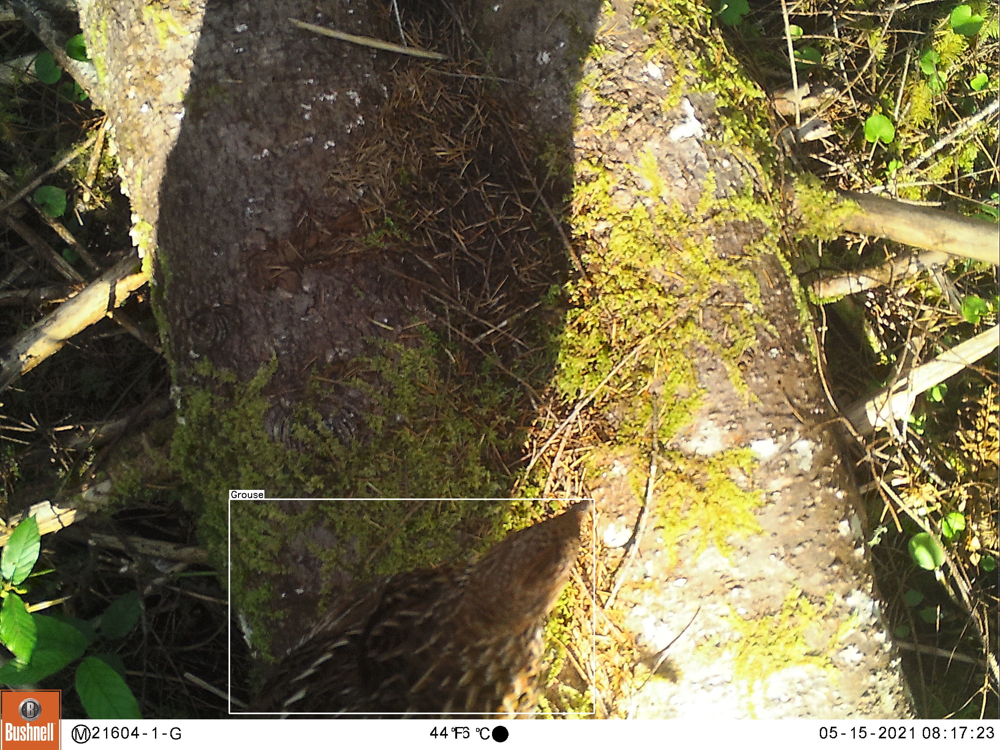

In [21]:
# Visualize annotations

from IPython.display import Image, display
display(dataset.visualize.ShowBoundingBoxes(50))
#display(dataset.visualize.ShowBoundingBoxes("image.jpg"))

In [23]:
# Export to YOLOv5 format
dataset.path_to_annotations = ""
print(path_to_annotations)
#txt_output = os.path('')

dataset.export.ExportToYoloV5(output_path='/mnt/ssd-cluster/cara/upload_ground_thresh620',
                              #output_path='/mnt/ssd-cluster/cara/upload_trail_thresh180',
                              #yaml_file='data/dataset.yaml',
                              copy_images=False,
                              cat_id_index=0)[0]

/home/cara/oregon_critters/json/dataset_ground_620_adjxy.json


Exporting YOLO files...:   0%|          | 0/6000 [00:00<?, ?it/s]

Exporting YOLO files...: 100%|██████████| 6000/6000 [08:05<00:00, 12.35it/s]


'/mnt/ssd-cluster/cara/dataset.yaml'